In [3]:
import sys

# Add the path to the system PATH
sys.path.append('/kaggle/working/PIKAN')

if True:
    !pip install -r /kaggle/working/PIKAN/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 685.9/685.9 kB 18.3 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.0/121.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 808.2/808.2 kB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 54.1 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 MB 20.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 85.7 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.7/223.7 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━

In [4]:
import jax
import jax.numpy as jnp
from typing import Any
from flax import linen as nn
from jax import random, grad, vmap, jit
from pikan.model_utils import gradf
import numpy as np
from functools import partial
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import optax

def animate_3d_array(data, cmap='jet', interval=50):
    fig, ax = plt.subplots()
    im = ax.imshow(data[:, :, 0], cmap=cmap, origin='lower', interpolation='nearest')
    plt.colorbar(im, ax=ax)

    def update(t):
        im.set_array(data[:, :, t])
        ax.set_title(f'Time step: {t}')
    
    anim = FuncAnimation(fig, update, frames=data.shape[2], interval=interval)
    
    plt.close(fig)  # Prevent static frame from showing
    
    # Return HTML representation of the animation for embedding in Jupyter
    return HTML(anim.to_jshtml())

def load_ns_data():
    data = np.load('PIKAN/ns_tori.npy', allow_pickle=True).item()

    for key in data.keys() - {"viscosity"}:
        data[key] = np.moveaxis(data[key], 0, -1)

    return data['u'], data['v'], data['w'], data['x'], data['y'], data['t']

In [5]:
from jax import jacrev, hessian, vmap

class NS_torus():
    def __init__(self, model, u0, v0, w0, x_star, y_star):
        self.model = model
        self.RE = 100
        
        self.neural_net_fn = vmap(self.neural_net, (None, 0,0,0))
            
        self.r_net_fn = vmap(self.r_net, (None, 0,0,0))
        self.u_net_fn = vmap(self.u_net, (None, 0,0,0))
        self.v_net_fn = vmap(self.v_net, (None, 0,0,0))
        self.w_net_fn = vmap(self.w_net, (None, 0,0,0))
        
        self.u0 = u0.reshape(-1)
        self.v0 = v0.reshape(-1)
        self.w0 = w0.reshape(-1)
        
        self.x_star = x_star.reshape(-1)
        self.y_star = y_star.reshape(-1)
        
    def neural_net(self, params, x, y, t):
        collocs = jnp.stack([x,y,t])
        outputs = self.model.apply(params, collocs)

        u = outputs[0]
        v = outputs[1]
        return u, v

    def u_net(self, params, x, y, t):
        u, _ = self.neural_net(params,x,y,t)
        return u
    
    def v_net(self, params, x, y, t):
        _, v = self.neural_net(params, x,y,t)
        return v

    def w_net(self, params, x, y, t):
        v_x = grad(self.v_net, argnums=1)(params,x,y,t)
        u_y = grad(self.u_net, argnums=2)(params,x,y,t)
        
        return v_x - u_y
    
    def r_net(self, params, x, y, t):
        u, v = self.neural_net(params, x, y, t)

        u_x = grad(self.u_net, argnums=1)(params, x, y, t)
        v_y = grad(self.v_net, argnums=2)(params, x, y, t)

        w_x, w_y, w_t = jacrev(self.w_net, argnums=(1, 2, 3))(params, x, y, t)

        w_hessian = hessian(self.w_net, argnums=(1, 2))(params, x, y, t)

        w_xx = w_hessian[0][0]
        w_yy = w_hessian[1][1]

        mom = w_t + u * w_x + v * w_y - 1/self.RE * (w_xx + w_yy)
        cont = u_x + v_y

        return mom, cont

    
    @partial(jit, static_argnums=(0,))
    def loss(self, params, collocs): # collocs shape (BS, 3)
        t0 = jnp.zeros_like(self.x_star)

        u0 = self.u_net_fn(params, self.x_star, self.y_star, t0)
        v0 = self.v_net_fn(params, self.x_star, self.y_star, t0)
        w0 = self.w_net_fn(params, self.x_star, self.y_star, t0)
        
        u0_loss = jnp.mean((u0 - self.u0)**2)
        v0_loss = jnp.mean((v0 - self.v0)**2)
        w0_loss = jnp.mean((w0 - self.w0)**2)
        
        ic_loss = u0_loss + v0_loss + w0_loss
        
        eq1, eq2 = self.r_net_fn(params, collocs[:, 0], collocs[:, 1], collocs[:, 2])
        res_loss = jnp.mean(eq1**2) + jnp.mean(eq2**2)
        
#        res_loss = 0 # SANITY CHECK
        new_loc_w = None
        return res_loss + ic_loss, new_loc_w

In [12]:
# model_utils.py

import jax
import jax.numpy as jnp
import optax
from flax import linen as nn
from typing import Callable, Optional
from dataclasses import field
from typing import List
from scipy.stats.qmc import Sobol
import numpy as np
import matplotlib.pyplot as plt
import time
#from jaxkan.models.KAN import KAN

from jax.nn.initializers import normal

class FourierFeats(nn.Module):
    num_output: int
    embed_scale = 1
    #std = 10
    
    @nn.compact
    def __call__(self, x):
        kernel = self.param(
            "kernel", normal(self.embed_scale), (x.shape[-1], self.num_output // 2)
        )
        y = jnp.concatenate(
            [jnp.cos(jnp.dot(x, kernel)), jnp.sin(jnp.dot(x, kernel))], axis=-1
        )
        return y

    
class GeneralizedMLP(nn.Module):
    kernel_init: Callable
    num_input: int
    num_output: int
    use_fourier_feats: bool = False  # Whether to use FourierFeats as the first layer
    layer_sizes: List[int] = field(default_factory=list)

    std = 10
    mean = 0

    @nn.compact
    def __call__(self, x):
        # Add periodic embeddings to the first two axes
        x = jnp.concatenate([
            jnp.array([jnp.cos(x[0]), jnp.sin(x[0])]),
            jnp.array([jnp.cos(x[1]), jnp.sin(x[1])]),
            jnp.array([x[2]]),
        ], axis=-1)
        
        # Add hidden layers
        for idx, size in enumerate(self.layer_sizes):
            if self.use_fourier_feats and idx==0:
                x = FourierFeats(size)(x)
            else:
                x = nn.Dense(size, kernel_init=self.kernel_init)(x)
                x = nn.tanh(x)

        # Final output layer
        x = nn.Dense(self.num_output, kernel_init=self.kernel_init)(x)
        return x

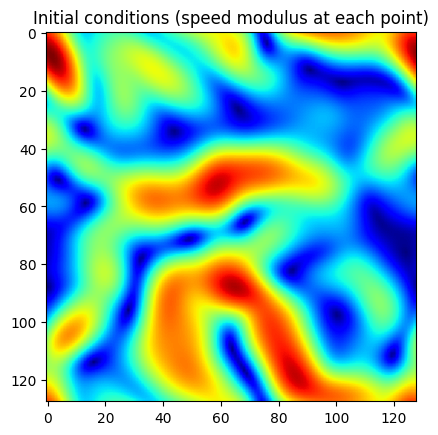

In [22]:
u,v,w,x,y,t = load_ns_data()
x_star, y_star = jnp.meshgrid(x, y, indexing="ij")

# u.shape
# x.shape
#print(u.shape, v.shape, w.shape)
plt.imshow(jnp.sqrt(u[:,:,0]**2 + v[:,:,0]**2), cmap='jet')
plt.title('Initial conditions (speed modulus at each point)')
plt.plot();

In [23]:
# Define your gradient function
grad_fn = jax.value_and_grad(ns_torus.loss, has_aux=True)

# Define the training loop
def train_step(params, collocs, opt_state):
    # Compute loss and gradients
    (loss, new_loc_w), grads = grad_fn(params, collocs)

    # Apply gradients to update the parameters
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    
    return params, opt_state, loss

In [24]:
model = GeneralizedMLP(
    kernel_init=nn.initializers.glorot_normal(),
    use_fourier_feats=True,
    num_input=3,
    num_output=2,
    layer_sizes=[256, 256, 256, 256] # first is fourier
)

dp = jnp.ones((3))
params = model.init(random.PRNGKey(0), dp)

ns_torus = NS_torus(
    model, 
    u[:, :, 0], v[:, :, 0], w[:, :, 0],
    x_star, y_star,
)

BS = 32
collocs = jnp.ones((BS, 3))
ns_torus.loss(params, collocs)

dp = jnp.ones(3)
ns_torus.neural_net(params, dp[0],dp[1],dp[2])

(Array(-0.59196556, dtype=float32), Array(-0.73642975, dtype=float32))

In [25]:
EPOCHS = 1000

# Define a cosine decay learning rate schedule
# Learning rate schedule (cosine decay)
schedule_fn = optax.cosine_decay_schedule(
    init_value=1e-3,      # Initial learning rate
    decay_steps=2000,     # Total number of decay steps
    alpha=0.1             # Final learning rate multiplier
)

# Optimizer setup with Adam
optimizer = optax.adamw(
    learning_rate=schedule_fn,
    b1=0.9,               # Beta1
    b2=0.999,             # Beta2
    eps=1e-8              # Epsilon
)

opt_state = optimizer.init(params)

Checkpoint loaded from epoch 19999


Loss  0.01366812:   0%|          | 1/10001 [00:00<1:09:32,  2.40it/s]

7.0097725e-05 9.311612e-05 0.0010214916


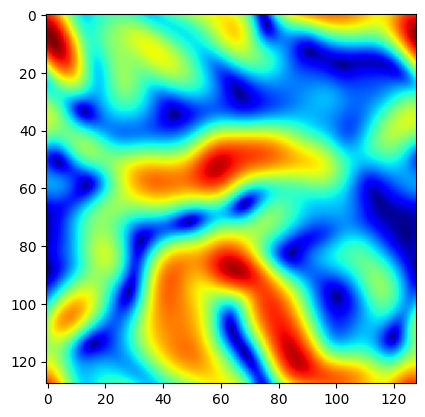

Loss  0.01366812:   0%|          | 2/10001 [00:01<1:52:45,  1.48it/s]

Checkpoint saved at epoch 20000


Loss  0.01161155:  10%|█         | 1001/10001 [07:04<1:02:26,  2.40it/s]

7.477203e-05 9.788669e-05 0.0009421753


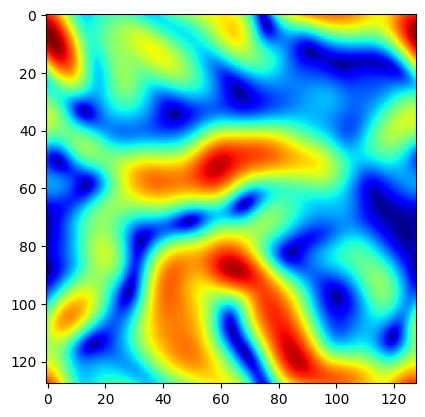

Loss  0.01161155:  10%|█         | 1002/10001 [07:05<1:24:27,  1.78it/s]

Checkpoint saved at epoch 21000


Loss  0.01229704:  20%|██        | 2001/10001 [14:08<55:05,  2.42it/s]  

5.8608526e-05 9.526986e-05 0.00088470423


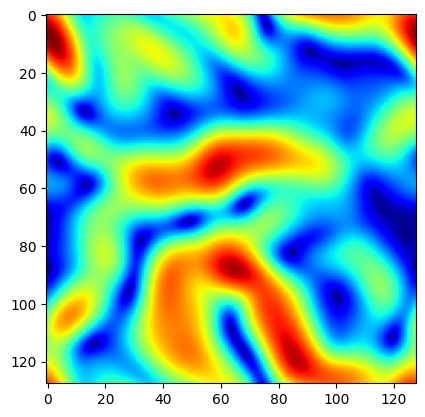

Loss  0.01229704:  20%|██        | 2002/10001 [14:09<1:14:38,  1.79it/s]

Checkpoint saved at epoch 22000


Loss  0.01134922:  30%|███       | 3001/10001 [21:12<48:41,  2.40it/s]  

6.547751e-05 8.461809e-05 0.00085632456


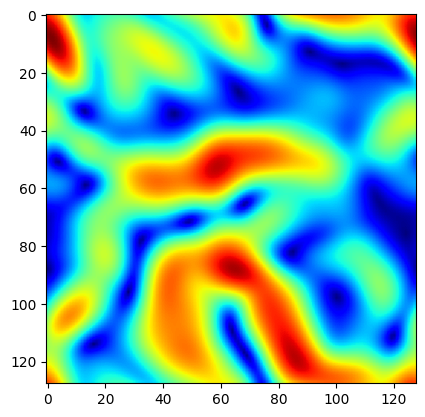

Loss  0.01134922:  30%|███       | 3002/10001 [21:13<1:05:25,  1.78it/s]

Checkpoint saved at epoch 23000


Loss  0.00975356:  40%|████      | 4001/10001 [28:16<41:35,  2.40it/s]  

6.6269815e-05 6.0750506e-05 0.00079450506


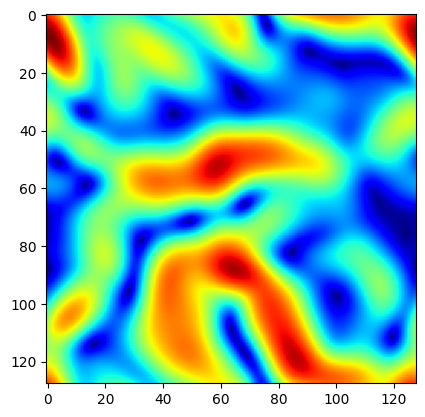

Loss  0.00975356:  40%|████      | 4002/10001 [28:16<55:18,  1.81it/s]

Checkpoint saved at epoch 24000


Loss  0.00969224:  50%|█████     | 5001/10001 [35:18<34:38,  2.41it/s]

5.6370725e-05 5.8313148e-05 0.0007461274


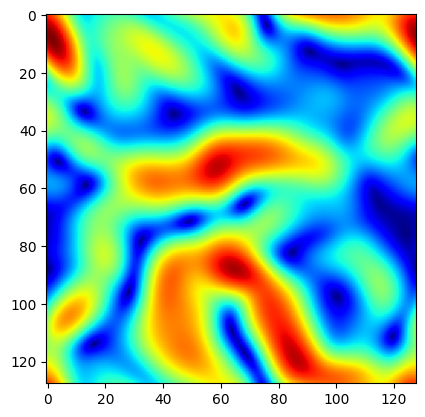

Loss  0.00969224:  50%|█████     | 5002/10001 [35:18<46:00,  1.81it/s]

Checkpoint saved at epoch 25000


Loss  0.00885650:  60%|██████    | 6001/10001 [42:20<28:01,  2.38it/s]

4.929436e-05 5.472434e-05 0.000721615


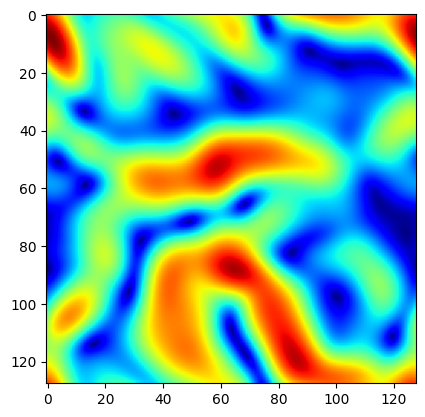

Loss  0.00885650:  60%|██████    | 6002/10001 [42:20<37:27,  1.78it/s]

Checkpoint saved at epoch 26000


Loss  0.00885650:  60%|██████    | 6020/10001 [42:29<28:05,  2.36it/s]


KeyboardInterrupt: 

In [37]:
import os
import pickle
from tqdm import tqdm
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
from pikan.model_utils import sobol_sample
from tqdm import tqdm 

# Define constants
BS = 8192
EPOCHS = 30000
TMAX = 2
CHECKPOINT_FILE = "model_checkpoint.pkl"

# Function to save parameters and state
def save_checkpoint(params, opt_state, epoch, filename):
    with open(filename, "wb") as f:
        pickle.dump({'params': params, 'opt_state': opt_state, 'epoch': epoch}, f)
    print(f"Checkpoint saved at epoch {epoch}")

# Function to load parameters and state
def load_checkpoint(filename, params, state):
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            checkpoint = pickle.load(f)
        print(f"Checkpoint loaded from epoch {checkpoint['epoch']}")
        return checkpoint['params'], checkpoint['opt_state'], checkpoint['epoch']
    return params, state, 0  # Default values if no checkpoint exists

# Initialize or load checkpoint
params, opt_state, start_epoch = load_checkpoint(CHECKPOINT_FILE, params, opt_state)

# Main training loop
for i in (pbar := tqdm(range(start_epoch, EPOCHS))):
    collocs = sobol_sample(np.array([0, 0, 0]), np.array([2 * np.pi, 2 * np.pi, TMAX]), BS)
    params, opt_state, loss = train_step(params, collocs, opt_state)
    
    if i % 50 == 0:
        pbar.set_description(f"Loss {loss: .8f}")
    
    if i % 1000 == 0:  # Save every 1000 epochs
        # Compute and print additional loss metrics
        t0 = jnp.zeros_like(ns_torus.x_star)
        u, v = ns_torus.neural_net_fn(params, ns_torus.x_star, ns_torus.y_star, t0)
        w0 = ns_torus.w_net_fn(params, ns_torus.x_star, ns_torus.y_star, t0)
        
        u0_loss = jnp.mean((u - ns_torus.u0)**2)
        v0_loss = jnp.mean((v - ns_torus.v0)**2)
        w0_loss = jnp.mean((w0 - ns_torus.w0)**2)
        print(u0_loss, v0_loss, w0_loss)

        # Save a visualization
        u, v = ns_torus.neural_net_fn(params, ns_torus.x_star, ns_torus.y_star, jnp.zeros_like(ns_torus.x_star))
        normflow = np.sqrt(u**2 + v**2).reshape((128, 128))
        plt.imshow(normflow, cmap="jet")
        plt.show()

        # Save the current state to checkpoint
        save_checkpoint(params, opt_state, i, CHECKPOINT_FILE)

save_checkpoint(params, opt_state, i, CHECKPOINT_FILE)

In [38]:
if True:
    CHECKPOINT_FILE = "model_checkpoint.pkl"
    params, opt_state, start_epoch = load_checkpoint(CHECKPOINT_FILE, params, opt_state)

Checkpoint loaded from epoch 26000


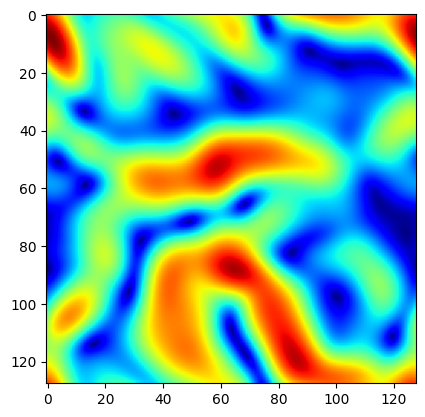

In [39]:
(u,v) = ns_torus.neural_net_fn(params, ns_torus.x_star, ns_torus.y_star, jnp.zeros_like(ns_torus.x_star))

normflow = np.sqrt(u**2 + v**2).reshape((128, 128))
plt.imshow(normflow, cmap="jet")

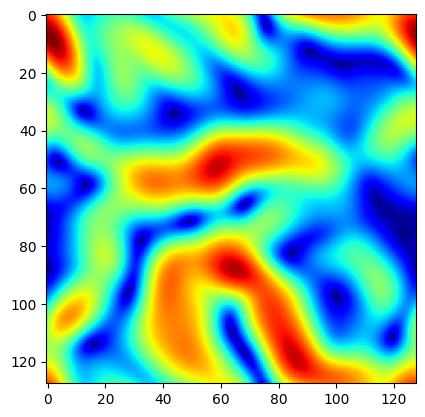

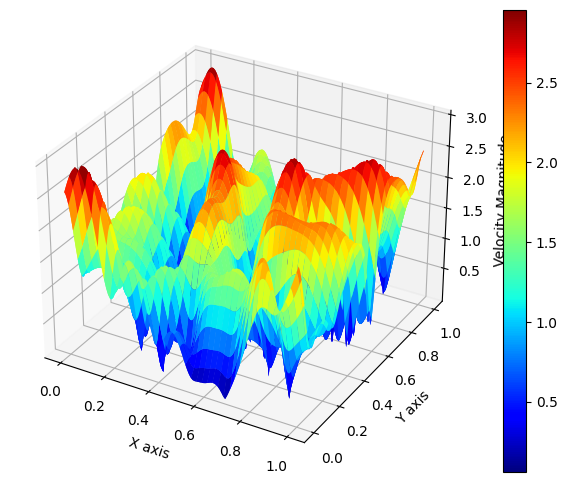

In [40]:
def plot_velocity_field(normflow, grid_size=128):
    x, y = np.linspace(0, 1, grid_size), np.linspace(0, 1, grid_size)
    X, Y = np.meshgrid(x, y, indexing="ij")
    
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, normflow, cmap="jet", edgecolor="none")
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Velocity Magnitude')
    plt.colorbar(ax.plot_surface(X, Y, normflow, cmap="jet", edgecolor="none"))
    plt.show()
    
normflow = np.sqrt(ns_torus.u0**2 + ns_torus.v0**2).reshape((128, 128))
plt.imshow(normflow, cmap="jet")
plot_velocity_field(normflow)

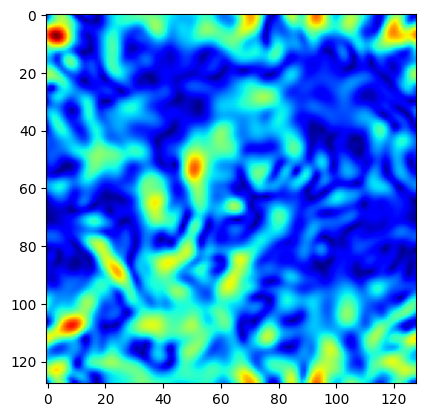

In [41]:
normflow = np.sqrt((u - ns_torus.u0)**2 + (v - ns_torus.v0)**2).reshape((128, 128))
plt.imshow(normflow, cmap="jet")

In [42]:
import jax.numpy as jnp

u, v, w, x, y, t = load_ns_data()

In [43]:
u = u[:, :, t<TMAX]
v = v[:, :, t<TMAX]

normflow = np.sqrt(u**2 + v**2)
animate_3d_array(normflow, interval=100)

In [44]:
x_star, y_star, t_star = jnp.meshgrid(x, y, t, indexing='ij')

mask = t_star < TMAX
x_filtered = x_star[mask]
y_filtered = y_star[mask]
t_filtered = t_star[mask]

(u_hat,v_hat) = ns_torus.neural_net_fn(params, x_filtered, y_filtered, t_filtered)
u_hat = u_hat.reshape(128, 128, -1)
v_hat = v_hat.reshape(128, 128, -1)

normflow = np.sqrt(u_hat**2 + v_hat**2)
animate_3d_array(normflow, interval=200)

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

def animate_3d_array_side_by_side(data1, data2, cmap1='jet', cmap2='jet', interval=100, output_filename="animation.gif"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    # Initialize first subplot
    im1 = ax1.imshow(data1[:, :, 0], cmap=cmap1, origin='lower', interpolation='nearest')
    plt.colorbar(im1, ax=ax1)
    ax1.set_title("Data 1")

    # Initialize second subplot
    im2 = ax2.imshow(data2[:, :, 0], cmap=cmap2, origin='lower', interpolation='nearest')
    plt.colorbar(im2, ax=ax2)
    ax2.set_title("Data 2")

    def update(t):
        """Update function for the animation."""
        im1.set_array(data1[:, :, t])
        im2.set_array(data2[:, :, t])
        ax1.set_title(f"True - Time step: {t}")
        ax2.set_title(f"Predicted - Time step: {t}")

    anim = FuncAnimation(fig, update, frames=data1.shape[2], interval=interval)

    # Save as GIF with a reduced frame rate to slow down the GIF
    anim.save(output_filename, writer=PillowWriter(fps=15))  # Adjust the fps here to control speed

    plt.close(fig)  # Prevent static frame from showing

    return HTML(anim.to_jshtml())

# Replace this with your data-loading and processing steps
u, v, w, x, y, t = load_ns_data()

x_star, y_star, t_star = jnp.meshgrid(x, y, t, indexing='ij')
# Filter points where t_star < 1
mask = t_star < TMAX
x_filtered = x_star[mask]
y_filtered = y_star[mask]
t_filtered = t_star[mask]

u = u[:, :, t < TMAX]
v = v[:, :, t < TMAX]

normflow = np.sqrt(u**2 + v**2)

(u_hat, v_hat) = ns_torus.neural_net_fn(params, x_filtered, y_filtered, t_filtered)
u_hat = u_hat.reshape(128, 128, -1)
v_hat = v_hat.reshape(128, 128, -1)
normflow_hat = np.sqrt(u_hat**2 + v_hat**2)

# Call the animation function and save as GIF
animate_3d_array_side_by_side(normflow, normflow_hat, output_filename="normflow_comparison.gif")

In [47]:
import jax.numpy as jnp

# Compute the L2 error for each frame (dimension 3)
diff = (normflow.reshape(128*128, -1) - normflow_hat.reshape(128*128, -1))
base = normflow.reshape(128*128, -1)

l2_error = jnp.linalg.norm(diff, axis=0) / jnp.linalg.norm(base, axis=0)

print(l2_error)

[0.00523172 0.00982908 0.01621087 0.02281279 0.02956685 0.03638314
 0.04314832 0.04979752 0.05632005 0.06275919 0.06921797 0.07576925
 0.08251502 0.08950249 0.09678043 0.10435565 0.11232742 0.12073082
 0.12961362 0.13898626 0.14884348 0.15912682 0.16973445 0.18052845
 0.19135052 0.2020804  0.21259788 0.22282727 0.23268773 0.24210843
 0.25109085 0.25962576 0.26766956 0.2751834  0.2822979  0.2891126
 0.29557014 0.30163726 0.30723974 0.31233943]
